In [202]:
using Plots,  OrdinaryDiffEq, LinearAlgebra
include("IntegratorTools.jl");

In [203]:
r(x,y) = (i,j) -> (x[i]-x[j])^2 + (y[i]-y[j])^2;

H(x,y) = -1/(4*π)*(log(r(x,y)(1,2)) + log(r(x,y)(1,3)) + log(r(x,y)(2,3)))

H(z) = H(z[1:3],z[4:6]);

L(z) = sum(z .^2)

P(z) = sum(z)



function Invariants(H,L,P,u)
errH = H(u[:,1]) .- H.(eachcol(u)) 
errL = L(u[:,1]) .- L.(eachcol(u))
errP = P(u[4:6,1]) .- P.(eachcol(u[4:6,:]))

return  errH, errL, errP
end

function plot_first_integrals(H, L, P, uNum,t)
  plot(t,Invariants(H,L,P,uNum)[1], lab="Energy variation")
  plot!(t,Invariants(H,L,P,uNum)[2],lab="Angular momentum variation")
  plot!(t,Invariants(H,L,P,uNum)[3],lab="Linear momentum variation")
end

plot_first_integrals (generic function with 1 method)

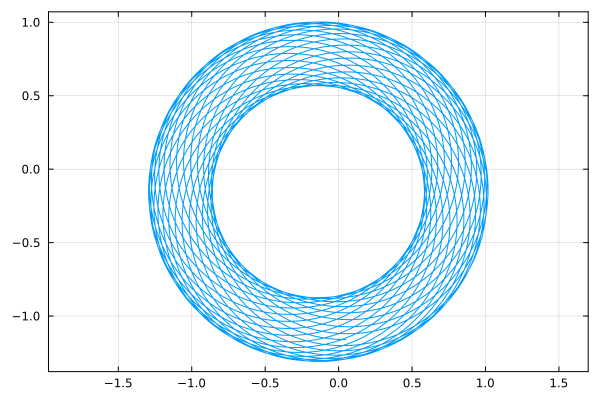

In [204]:
# Define Hamiltonian system to solve

function Vortex3D!(udot,u,p,t)
    x = u[1:3];
    y = u[4:6];
    r12 = (x[1]-x[2])^2 + (y[1]-y[2])^2;
    r13 = (x[1]-x[3])^2 + (y[1]-y[3])^2;
    r23 = (x[2]-x[3])^2 + (y[2]-y[3])^2;
   

    udot[1] = -1/(2π) * ((y[1]-y[2])/r12+(y[1]-y[3])/r13)
    udot[2] = -1/(2π) * ((y[2]-y[1])/r12+(y[2]-y[3])/r23)
    udot[3] = -1/(2π) * ((y[3]-y[1])/r13+(y[3]-y[2])/r23)
  
    udot[4] =  1/(2π) * ((x[1]-x[2])/r12+(x[1]-x[3])/r13)
    udot[5] =  1/(2π) * ((x[2]-x[1])/r12+(x[2]-x[3])/r23)
    udot[6] =  1/(2π) * ((x[3]-x[1])/r13+(x[3]-x[2])/r23)
  
end

a = π / 3;

ϵ = π / 5 ;  # ϵ = 0

# Initial conditions = equilateral triangle point

# x₁ = cos(0)    ; x₂ = cos(2a) ;   x₃ = cos(4a);   
# y₁ = sin(0)    ; y₂ = sin(2a) ;  y₃ = sin(4a); 

# Initial conditions = equilateral triangle point


 x₁ = cos(0)    ; x₂ = cos(2a+ϵ) ;   x₃ = cos(4a);   
 y₁ = sin(0)    ; y₂ = sin(2a+ϵ) ;  y₃ = sin(4a); 


u0 = [x₁ ; x₂ ; x₃; y₁ ; y₂ ; y₃];
tspan = (0.0,1000.0);

prob = ODEProblem(Vortex3D!,u0,tspan)

sol = solve(prob,Tsit5(),reltol=1e-10,abstol=1e-10)

uExact = stack(sol.u,dims=2)

plot(sol,vars=(1,4),frame=:box,aspect_ratio=:equal,legend=false)
#scatter!([x₁],[y₁])
#scatter!([x₂],[y₂])
#scatter!([x₃],[y₃])
#t=range(0,10,1000)
#plot!(cos.(t),sin.(t))

In [205]:
function fVortex3D(u)
    x = u[1:3];
    y = u[4:6];
    r12 = (x[1]-x[2])^2 + (y[1]-y[2])^2;
    r13 = (x[1]-x[3])^2 + (y[1]-y[3])^2;
    r23 = (x[2]-x[3])^2 + (y[2]-y[3])^2;
    
return Ydot=[-1/(2π) * ((y[1]-y[2])/r12+(y[1]-y[3])/r13);
        -1/(2π) * ((y[2]-y[1])/r12+(y[2]-y[3])/r23)
        -1/(2π) * ((y[3]-y[1])/r13+(y[3]-y[2])/r23);
        1/(2π) * ((x[1]-x[2])/r12+(x[1]-x[3])/r13);
        1/(2π) * ((x[2]-x[1])/r12+(x[2]-x[3])/r23);
         1/(2π) * ((x[3]-x[1])/r13+(x[3]-x[2])/r23)];    
end

fVortex3D (generic function with 2 methods)

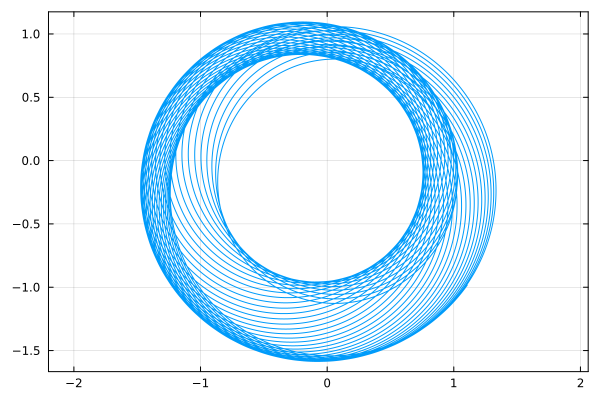

In [213]:
h = 2e-2; N =Int(1e5);   ts = (0:N) * h;

u =  ExpEuler(fVortex3D,u0,h,N);

plot(u[1,:],u[4,:],frame=:box,aspect_ratio=:equal,legend = false)

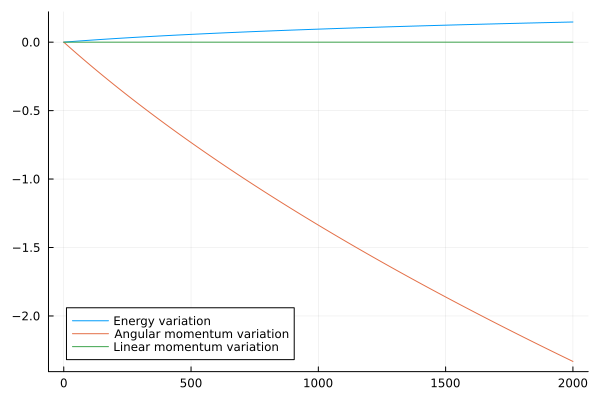

In [214]:
ts = (0:N) * h;
plot_first_integrals(H, L, P, u,ts)

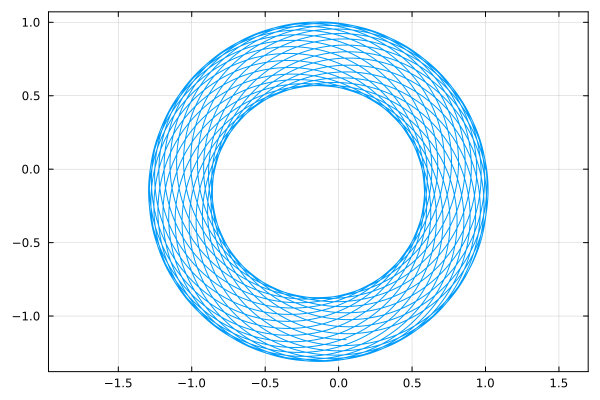

In [188]:
h = 5e-2; N =Int(2e4);

uMid = MidPoint(fVortex3D,u0,h,N);
plot(uMid[1,:],uMid[4,:],frame=:box,aspect_ratio=:equal,legend = false)

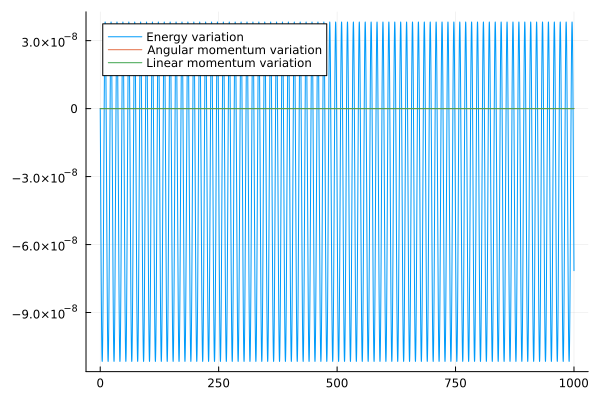

In [189]:
ts = (0:N) * h;
plot_first_integrals(H, L, P, uMid,ts)

In [187]:
function ∇pH(x,y)
    r12 = (x[1]-x[2])^2 + (y[1]-y[2])^2;
    r13 = (x[1]-x[3])^2 + (y[1]-y[3])^2;
    r23 = (x[2]-x[3])^2 + (y[2]-y[3])^2;
    
return Ydot=[-1/(2π) * ((y[1]-y[2])/r12+(y[1]-y[3])/r13);-1/(2π) * ((y[2]-y[1])/r12+(y[2]-y[3])/r23);-1/(2π) * ((y[3]-y[1])/r13+(y[3]-y[2])/r23)];    
end


function ∇qH(x,y)
    r12 = (x[1]-x[2])^2 + (y[1]-y[2])^2;
    r13 = (x[1]-x[3])^2 + (y[1]-y[3])^2;
    r23 = (x[2]-x[3])^2 + (y[2]-y[3])^2;
    
return Ydot=[1/(2π) * ((x[1]-x[2])/r12+(x[1]-x[3])/r13);  1/(2π) * ((x[2]-x[1])/r12+(x[2]-x[3])/r23); 1/(2π) * ((x[3]-x[1])/r13+(x[3]-x[2])/r23)];   
end


∇qH (generic function with 1 method)

In [207]:
#=
u0 = [x₁ ; x₂ ; x₃; y₁ ; y₂ ; y₃];
q0 = u0[1:3] ; p0 = u0[4:6];
h = 5e-2; N =Int(2e4);   ts = (0:N) * h;
u =  StormerVerlet2(∇pH,∇qH,q0,p0,h,N);
plot(u[1,:],u[4,:],frame=:box,aspect_ratio=:equal,legend = false)
#plot_first_integrals(H, L, P, u,ts)
=#

In [208]:
#=
h = 5e-3; N =Int(2e5);   ts = (0:N) * h;
u =  SympEuler2(∇pH,∇qH,q0,p0,h,N);
plot(u[1,:],u[4,:],frame=:box,aspect_ratio=:equal,legend = false);
#plot_first_integrals(H, L, P, u,ts)
=#